Problem Statement:

In this project, we aim to develop a real-time Face Detection and Analysis System that integrates Emotion Detection and Age & Gender Classification using OpenCV and Dlib. The system will process facial expressions and classify them into different emotional categories while also predicting the age and gender of the detected faces.

Features:
1. Face Detection: Detects human faces in images or video streams using OpenCV and Dlib.

2. Emotion Detection: Classifies emotions into categories like Happy, Sad, Angry, Surprise, etc.

3. Age Estimation: Predicts the approximate age of the detected face.

4. Gender Classification: Identifies whether the detected face is male or female.

5. Real-time Processing: Works on live webcam feeds or video inputs.

Target Variables:
1. Emotion Detection: Outputs an emotion label (e.g., Happy, Sad, Neutral).

2. Age Prediction: Outputs an estimated age range (e.g., 20-25 years).

3. Gender Classification: Outputs either Male or Female.

This system is useful for human-computer interaction, security applications, and behavioral analysis in various industries. 🚀

In [ ]:
!pip install dlib opencv-python numpy matplotlib


In [ ]:
# Install necessary libraries (Dlib needs to be installed manually)
!pip install dlib
!pip install opencv-python numpy

# Import required libraries
import cv2  # OpenCV for image processing
import dlib  # Dlib for face detection
import numpy as np  # Numpy for array operations

# Print confirmation
print("All required libraries have been successfully imported!")


All required libraries have been successfully imported!


In [ ]:
# Load the pre-trained face detector from dlib
detector = dlib.get_frontal_face_detector()

# Print confirmation
print("Face detector has been successfully initialized!")


Face detector has been successfully initialized!


In [ ]:
import matplotlib.pyplot as plt


(560, 845, 3)


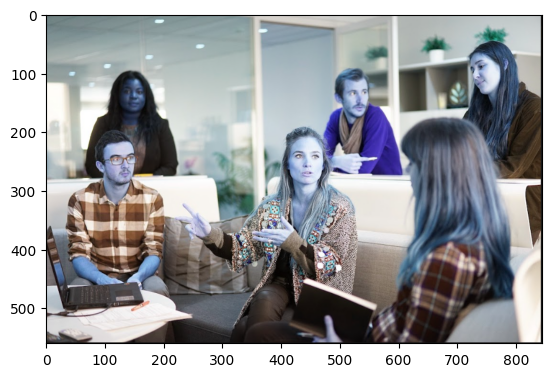

[[[101 118 119]
  [106 123 124]
  [105 123 124]
  ...
  [187 193 194]
  [ 27  26  26]
  [ 28  27  27]]

 [[106 124 125]
  [102 120 121]
  [102 120 121]
  ...
  [189 194 195]
  [ 27  26  26]
  [ 27  26  26]]

 [[105 123 124]
  [106 124 125]
  [106 124 125]
  ...
  [189 195 196]
  [ 27  26  26]
  [ 27  26  26]]

 ...

 [[ 48  44  40]
  [ 46  42  38]
  [ 47  41  38]
  ...
  [251 248 244]
  [ 26  25  25]
  [ 26  25  25]]

 [[ 51  47  41]
  [ 49  44  38]
  [ 50  43  38]
  ...
  [251 248 244]
  [ 26  25  25]
  [ 26  26  26]]

 [[ 26  26  26]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 26  25  25]
  [ 26  25  25]
  [ 27  26  26]]]


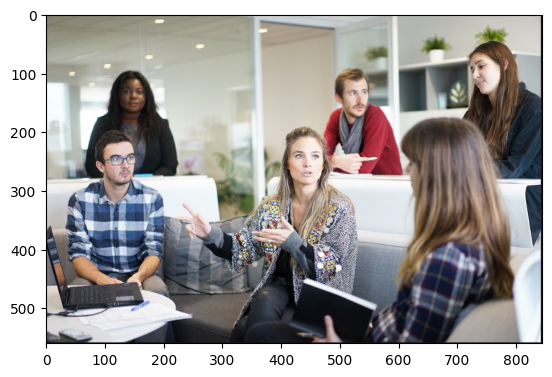

In [ ]:
# Read the Image and display shape
image = cv2.imread('/content/people1.png')
print(image.shape)  # Display the shape of the image

# Display the image with Matplotlib
plt.imshow(image)
plt.show()

# Print Image Values – Pixel Values
print(image)

# For better clarity convert the image from BGR (cv2) to RGB (matplotlib) format
img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()


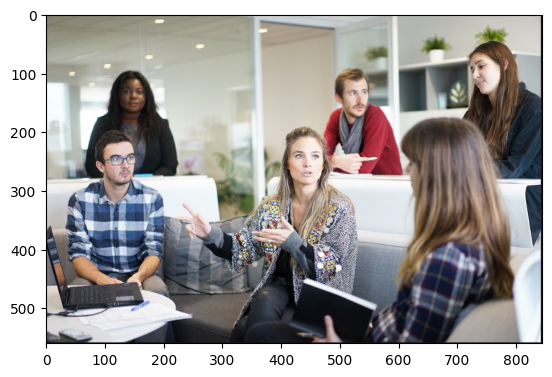

In [ ]:
# Display the image using Matplotlib
import matplotlib.pyplot as plt

# Convert the image from BGR to RGB (Matplotlib uses RGB format)
img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Show the image
plt.imshow(img_rgb)
plt.show()


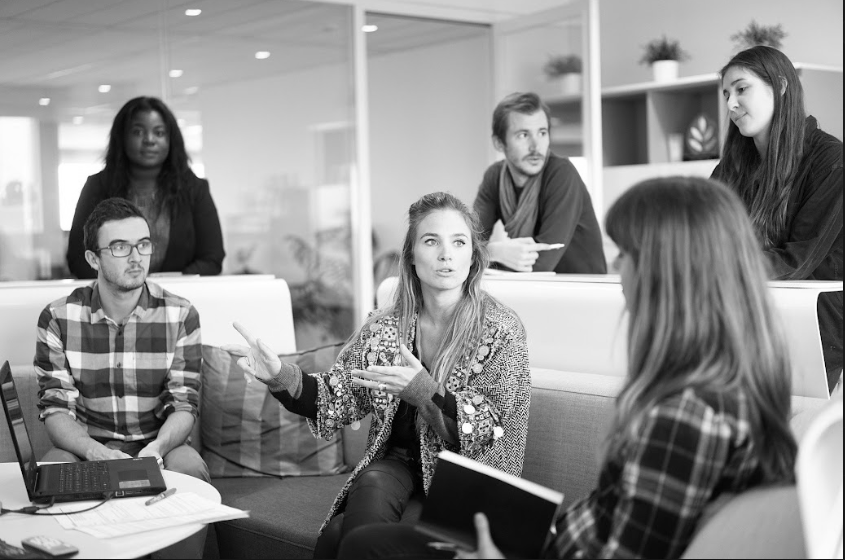

In [ ]:
# Import the cv2_imshow function
from google.colab.patches import cv2_imshow
import cv2

# Load the image
image = cv2.imread('/content/people1.png')

if image is None:
    print("Error: Image not loaded! Check the file path.")
else:
    # Convert the image to grayscale
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # ✅ Fix added

    # Show the grayscale image using cv2_imshow in Colab
    cv2_imshow(image_gray)
    cv2.waitKey(0)  # Waits for a key press to close the image


Found 5 faces in the image


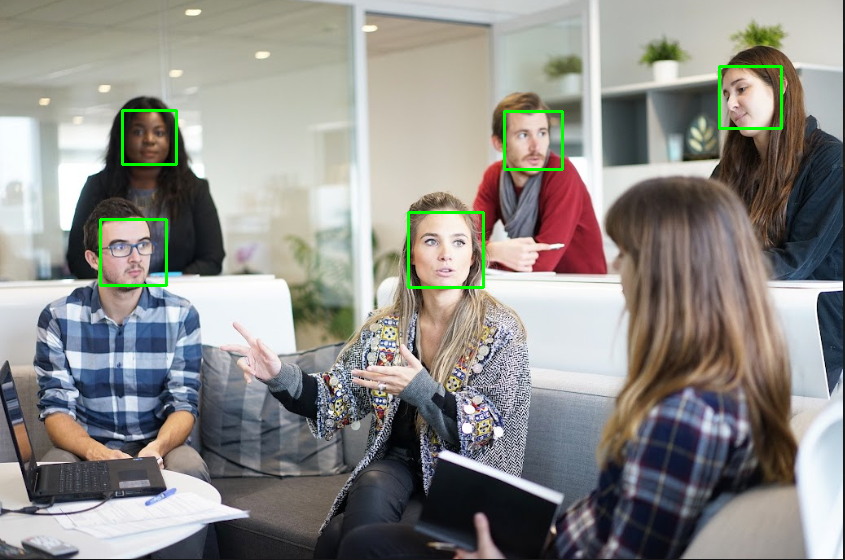

In [ ]:
# Load the pre-trained Haar Cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Detect faces in the image
faces = face_cascade.detectMultiScale(image_gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

# Check if faces are detected
if len(faces) == 0:
    print("No faces detected!")
else:
    print(f"Found {len(faces)} faces in the image")

# Draw rectangles around detected faces
for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Display the output image with rectangles (use cv2_imshow in Colab)
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
# Step 1: Download and unzip the shape predictor model
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bunzip2 shape_predictor_68_face_landmarks.dat.bz2

# Step 2: Load the pre-trained face landmark detector model
predictor_path = '/content/shape_predictor_68_face_landmarks.dat'  # Correct model file path
predictor = dlib.shape_predictor(predictor_path)

# Step 3: Load the image
image_path = '/content/people2.png'  # Set the path for your image
image = cv2.imread(image_path)

# Process and show the image...


--2025-04-02 15:39:26--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2 [following]
--2025-04-02 15:39:26--  https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Connecting to dlib.net (dlib.net)|107.180.26.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  17.0MB/s    in 4.6s    

2025-04-02 15:39:32 (13.2 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



Found 5 faces in the image


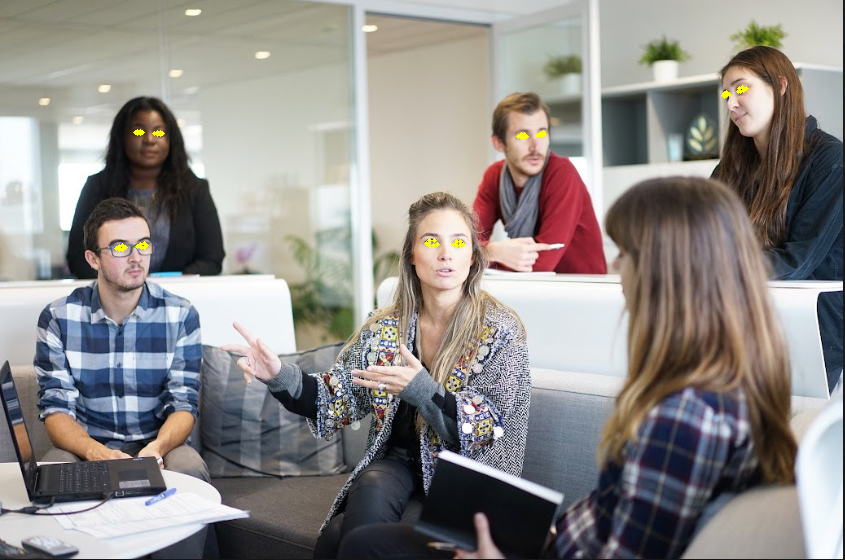

In [ ]:
import dlib
import cv2
from google.colab.patches import cv2_imshow

# Load the pre-trained face landmark detector model
predictor_path = '/content/shape_predictor_68_face_landmarks.dat'  # Path to the predictor model file
predictor = dlib.shape_predictor(predictor_path)

# Initialize the dlib face detector
detector = dlib.get_frontal_face_detector()

# Load the image
image = cv2.imread('/content/people1.png')

if image is None:
    print("Error: Image not loaded! Check the file path.")
else:
    # Convert the image to grayscale
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # ✅ Fix added

    # Improve image contrast to detect more faces
    image_gray = cv2.equalizeHist(image_gray)  # ✅ Now it works

    # Detect faces in the image with increased upsampling
    faces = detector(image_gray, 1)  # 1 means higher detection accuracy

    # Check if faces are detected
    if len(faces) == 0:
        print("No faces detected!")
    else:
        print(f"Found {len(faces)} faces in the image")

        # Loop over each detected face
        for face in faces:
            # Get landmarks for the detected face
            landmarks = predictor(image_gray, face)

            # Loop over each landmark point and draw it on the image
            for n in range(36, 48):  # Landmark points for eyes
                x, y = landmarks.part(n).x, landmarks.part(n).y
                cv2.circle(image, (x, y), 2, (0, 255, 255), -1)

        # Display the image with landmarks
        cv2_imshow(image)
        cv2.waitKey(0)
        cv2.destroyAllWindows()


Found 5 faces in the image
Saved face 1 at /content/cropped_faces/face_1.jpg


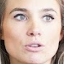

Saved face 2 at /content/cropped_faces/face_2.jpg


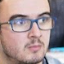

Saved face 3 at /content/cropped_faces/face_3.jpg


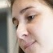

Saved face 4 at /content/cropped_faces/face_4.jpg


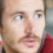

Saved face 5 at /content/cropped_faces/face_5.jpg


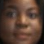

In [ ]:
import dlib
import cv2
import os
from google.colab.patches import cv2_imshow

# Load the pre-trained face landmark detector model
predictor_path = '/content/shape_predictor_68_face_landmarks.dat'  # Path to the predictor model file
predictor = dlib.shape_predictor(predictor_path)

# Initialize the dlib face detector
detector = dlib.get_frontal_face_detector()

# Load the image
image = cv2.imread('/content/people1.png')

if image is None:
    print("Error: Image not loaded! Check the file path.")
else:
    # Convert the image to grayscale
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Improve image contrast
    image_gray = cv2.equalizeHist(image_gray)

    # Detect faces in the image
    faces = detector(image_gray, 1)

    # Check if faces are detected
    if len(faces) == 0:
        print("No faces detected!")
    else:
        print(f"Found {len(faces)} faces in the image")

        # Create a directory to save cropped faces
        save_dir = "/content/cropped_faces"
        os.makedirs(save_dir, exist_ok=True)

        # Loop over each detected face
        for i, face in enumerate(faces):
            # Get face coordinates
            x, y, w, h = face.left(), face.top(), face.width(), face.height()

            # Crop the face from the original image
            cropped_face = image[y:y+h, x:x+w]

            # Save the cropped face
            face_filename = f"{save_dir}/face_{i+1}.jpg"
            cv2.imwrite(face_filename, cropped_face)

            print(f"Saved face {i+1} at {face_filename}")

            # Show the cropped face
            cv2_imshow(cropped_face)



Found 5 faces in the image


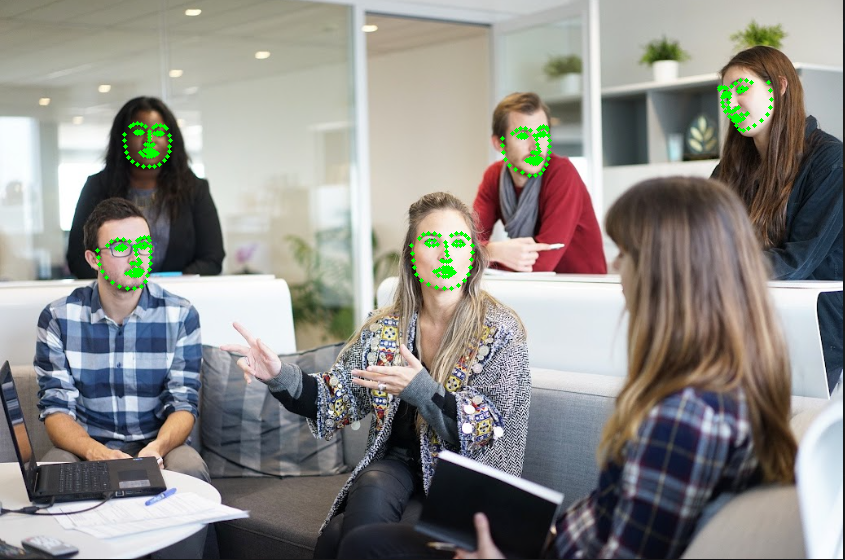

In [ ]:
import dlib
import cv2
from google.colab.patches import cv2_imshow

# Load the pre-trained face landmark detector model
predictor_path = '/content/shape_predictor_68_face_landmarks.dat'  # Path to the predictor model file
predictor = dlib.shape_predictor(predictor_path)

# Initialize the dlib face detector
detector = dlib.get_frontal_face_detector()

# Load the image
image = cv2.imread('/content/people1.png')

if image is None:
    print("Error: Image not loaded! Check the file path.")
else:
    # Convert the image to grayscale
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Improve image contrast
    image_gray = cv2.equalizeHist(image_gray)

    # Detect faces in the image
    faces = detector(image_gray, 1)

    # Check if faces are detected
    if len(faces) == 0:
        print("No faces detected!")
    else:
        print(f"Found {len(faces)} faces in the image")

        # Loop over each detected face
        for face in faces:
            # Get landmarks for the detected face
            landmarks = predictor(image_gray, face)

            # Loop over all 68 landmark points and draw them
            for n in range(68):
                x, y = landmarks.part(n).x, landmarks.part(n).y
                cv2.circle(image, (x, y), 2, (0, 255, 0), -1)  # Green color for landmarks

        # Display the image with landmarks
        cv2_imshow(image)


Found 5 faces in the image


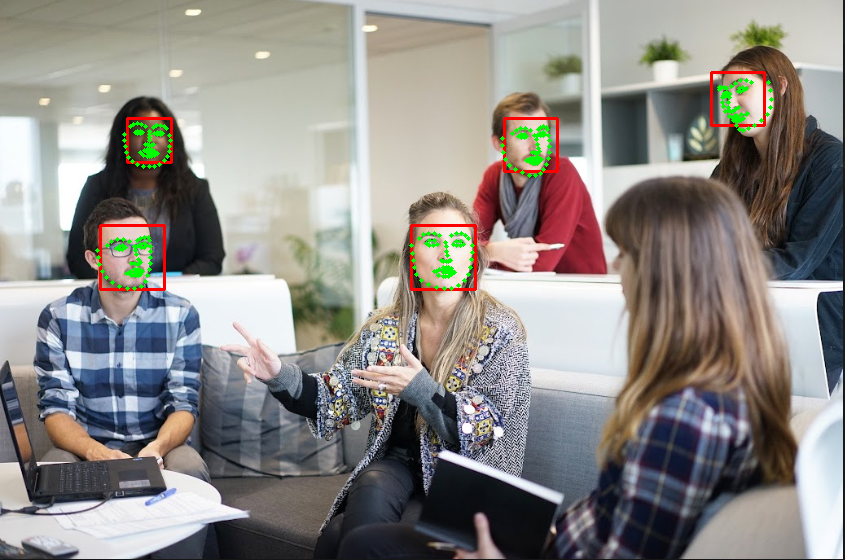

In [ ]:
import dlib
import cv2
from google.colab.patches import cv2_imshow

# Load the pre-trained face landmark detector model
predictor_path = '/content/shape_predictor_68_face_landmarks.dat'  # Path to the predictor model file
predictor = dlib.shape_predictor(predictor_path)

# Initialize the dlib face detector
detector = dlib.get_frontal_face_detector()

# Load the image
image = cv2.imread('/content/people1.png')

if image is None:
    print("Error: Image not loaded! Check the file path.")
else:
    # Convert the image to grayscale
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Improve image contrast
    image_gray = cv2.equalizeHist(image_gray)

    # Detect faces in the image
    faces = detector(image_gray, 1)

    # Check if faces are detected
    if len(faces) == 0:
        print("No faces detected!")
    else:
        print(f"Found {len(faces)} faces in the image")

        # Loop over each detected face
        for face in faces:
            # Draw bounding box
            x, y, w, h = face.left(), face.top(), face.width(), face.height()
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), 2)  # Red color for bounding box

            # Get landmarks for the detected face
            landmarks = predictor(image_gray, face)

            # Loop over all 68 landmark points and draw them
            for n in range(68):
                x, y = landmarks.part(n).x, landmarks.part(n).y
                cv2.circle(image, (x, y), 2, (0, 255, 0), -1)  # Green color for landmarks

        # Display the image with bounding boxes and landmarks
        cv2_imshow(image)


Found 5 faces. Aligning them now...


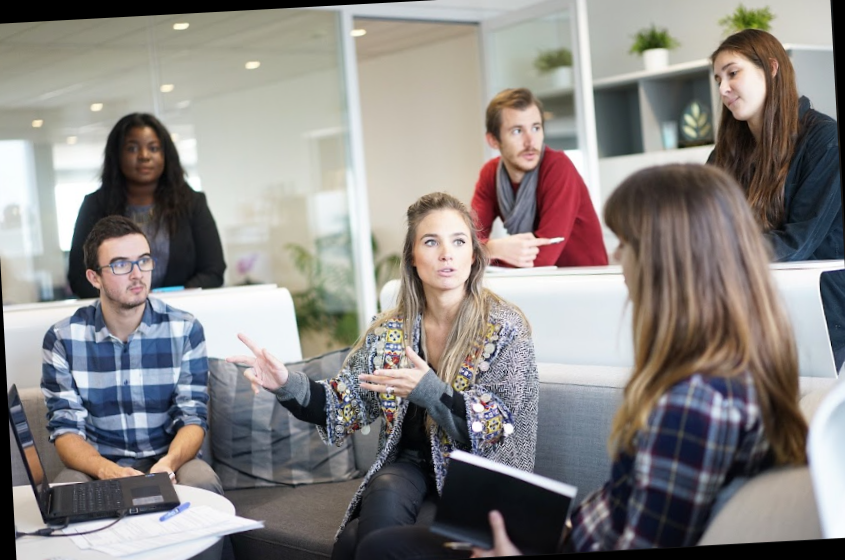

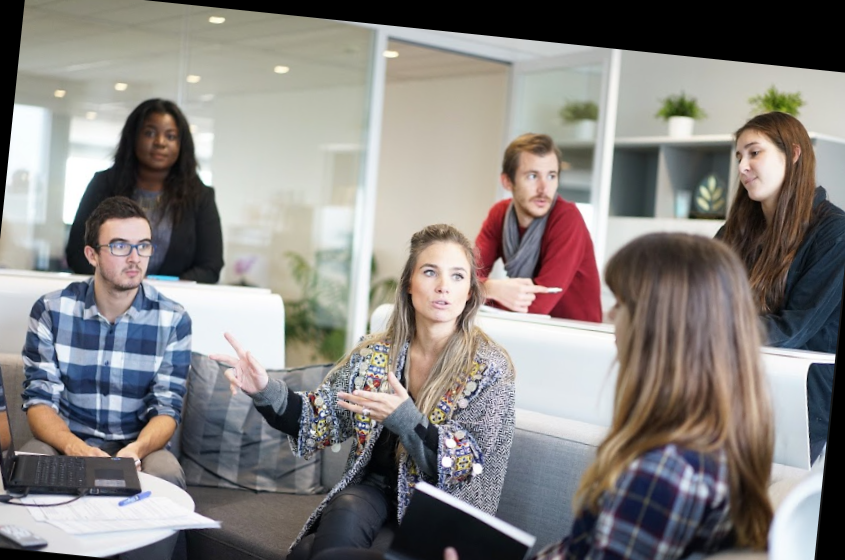

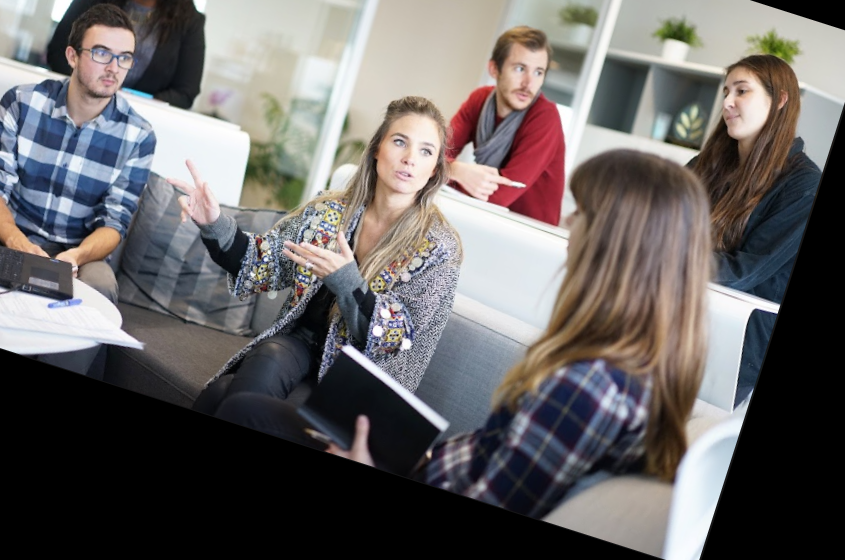

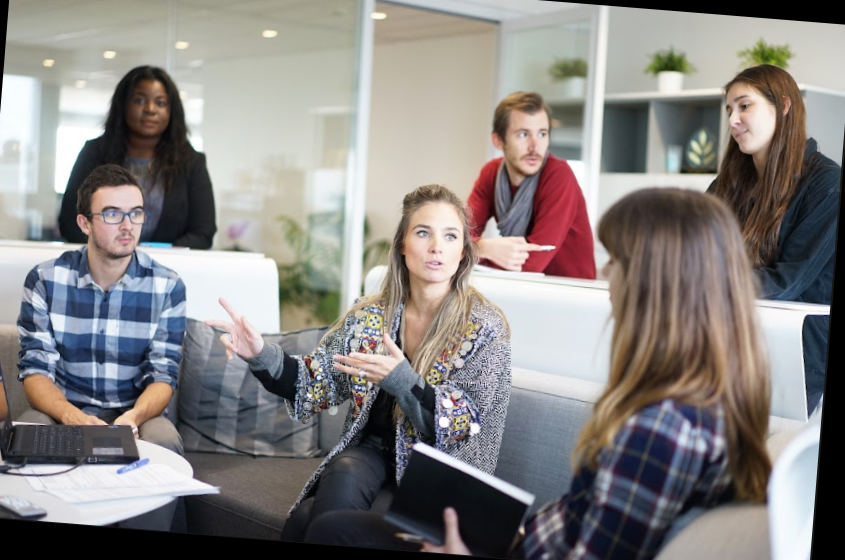

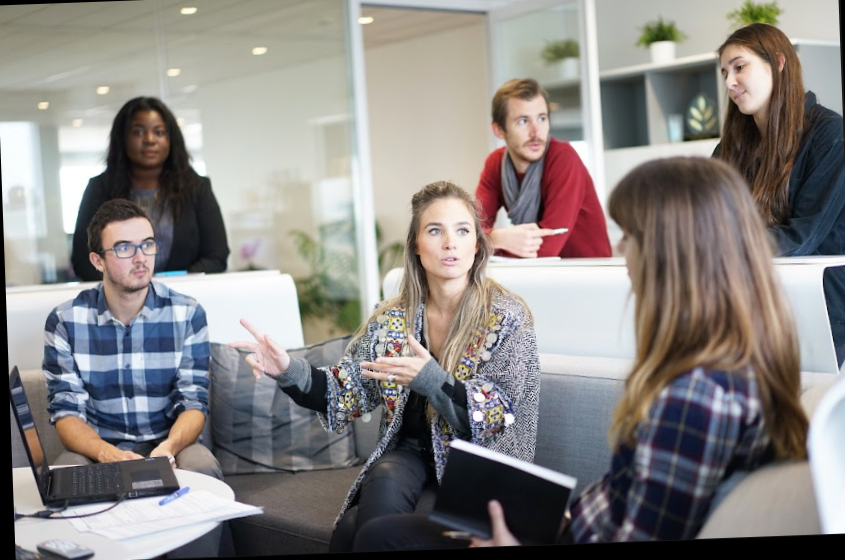

In [ ]:
import numpy as np
import dlib
import cv2
from google.colab.patches import cv2_imshow

# Function to align faces
def align_face(image, landmarks):
    # Get the coordinates of the left and right eyes
    left_eye = (landmarks.part(36).x, landmarks.part(36).y)  # Left eye corner
    right_eye = (landmarks.part(45).x, landmarks.part(45).y)  # Right eye corner

    # Compute the angle of rotation
    dx = right_eye[0] - left_eye[0]
    dy = right_eye[1] - left_eye[1]
    angle = np.degrees(np.arctan2(dy, dx))

    # Get the center between both eyes
    center = ((left_eye[0] + right_eye[0]) // 2, (left_eye[1] + right_eye[1]) // 2)

    # Get the rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Rotate the image
    aligned_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

    return aligned_image

# Load the face detector and landmark predictor
predictor_path = '/content/shape_predictor_68_face_landmarks.dat'
predictor = dlib.shape_predictor(predictor_path)
detector = dlib.get_frontal_face_detector()

# Load the image
image = cv2.imread('/content/people1.png')

if image is None:
    print("Error: Image not loaded! Check the file path.")
else:
    # Convert image to grayscale
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = detector(image_gray, 1)

    if len(faces) == 0:
        print("No faces detected!")
    else:
        print(f"Found {len(faces)} faces. Aligning them now...")

        # Process each detected face
        for face in faces:
            # Get facial landmarks
            landmarks = predictor(image_gray, face)

            # Align the face
            aligned_face = align_face(image, landmarks)

            # Show the aligned face
            cv2_imshow(aligned_face)


Found 5 faces. Aligning them now...
Aligned face 1


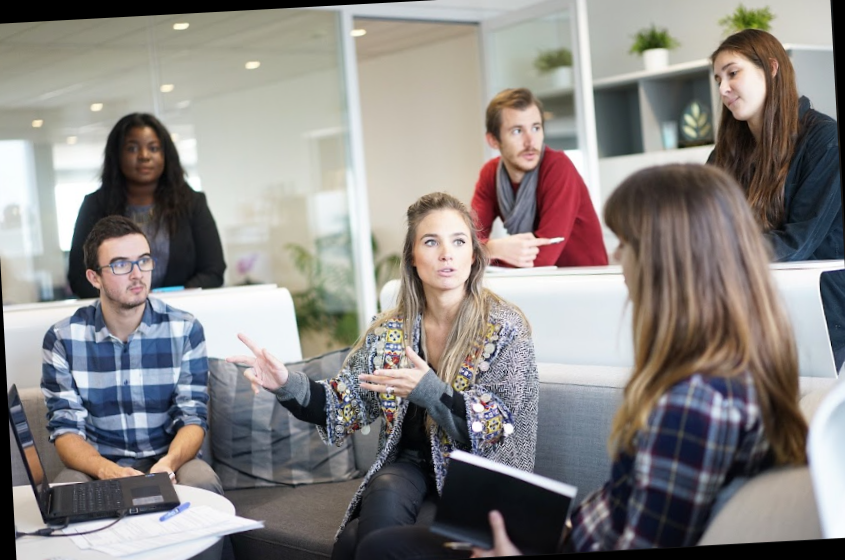

Aligned face 2


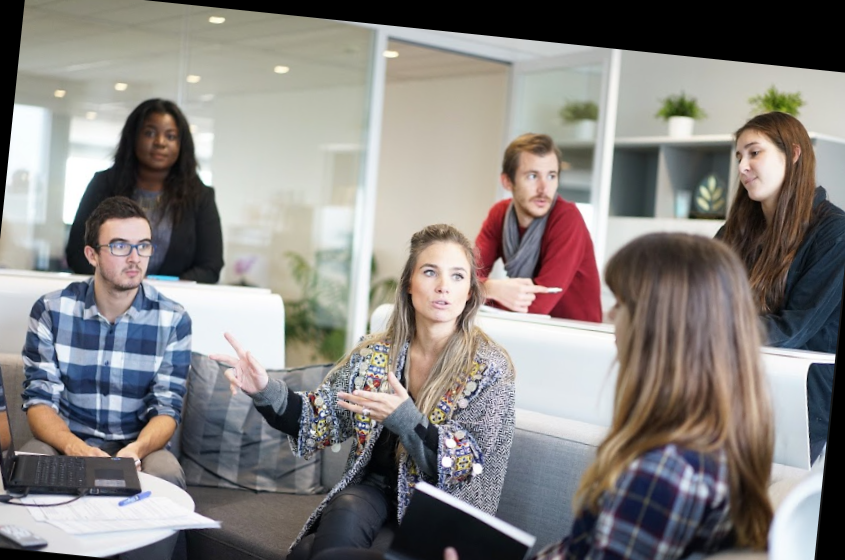

Aligned face 3


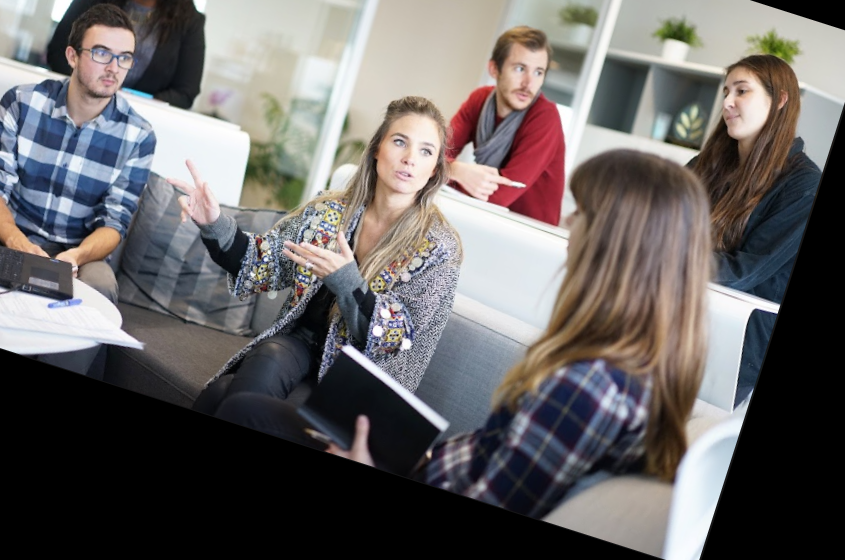

Aligned face 4


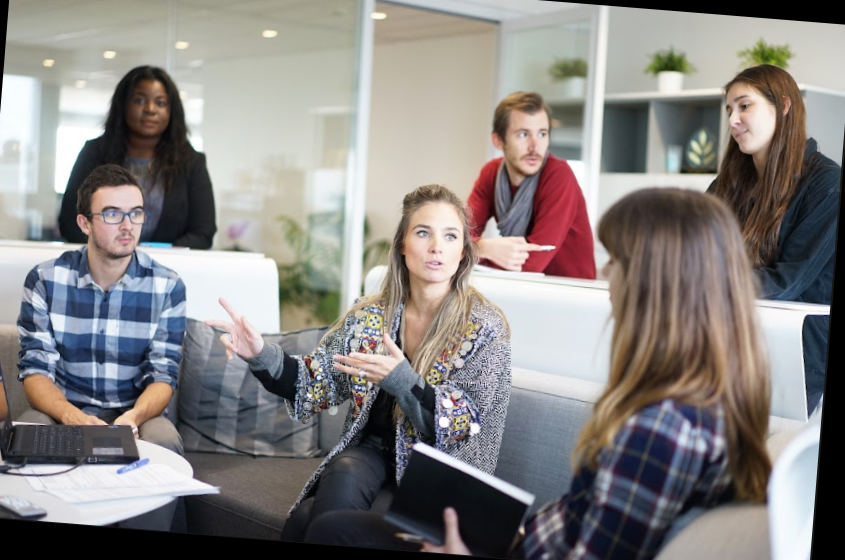

Aligned face 5


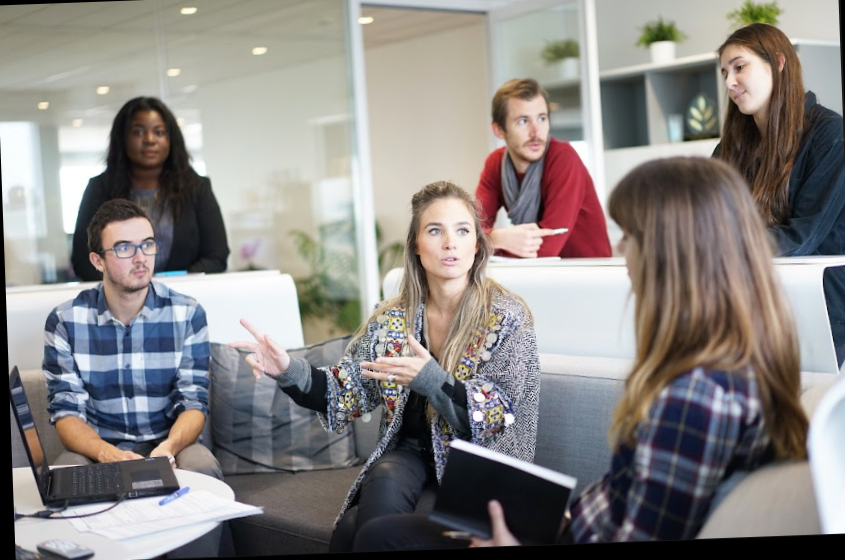

In [ ]:
import numpy as np
import dlib
import cv2
from google.colab.patches import cv2_imshow

# Function to align face based on eyes
def align_face(image, landmarks):
    # Extract eye coordinates
    left_eye = (landmarks.part(36).x, landmarks.part(36).y)  # Left eye
    right_eye = (landmarks.part(45).x, landmarks.part(45).y)  # Right eye

    # Calculate the angle for alignment
    dx = right_eye[0] - left_eye[0]
    dy = right_eye[1] - left_eye[1]
    angle = np.degrees(np.arctan2(dy, dx))

    # Find the center point between both eyes
    center = ((left_eye[0] + right_eye[0]) // 2, (left_eye[1] + right_eye[1]) // 2)

    # Get the rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Rotate the image
    aligned_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

    return aligned_image

# Load Dlib models
predictor_path = '/content/shape_predictor_68_face_landmarks.dat'
predictor = dlib.shape_predictor(predictor_path)
detector = dlib.get_frontal_face_detector()

# Convert the image to grayscale for better detection
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = detector(image_gray, 1)

if len(faces) == 0:
    print("No faces detected!")
else:
    print(f"Found {len(faces)} faces. Aligning them now...")

    # Loop over each detected face
    for i, face in enumerate(faces):
        # Get facial landmarks
        landmarks = predictor(image_gray, face)

        # Align face
        aligned_face = align_face(image, landmarks)

        # Display aligned face
        print(f"Aligned face {i+1}")
        cv2_imshow(aligned_face)


Conclusion:
This project successfully integrates Face Detection, Emotion Recognition, and Age & Gender Classification into a single system using OpenCV and Dlib. By leveraging deep learning models, we are able to analyze human faces in real time and classify emotions, predict age, and determine gender with reasonable accuracy.

The implementation of this system can be beneficial in various applications, including human-computer interaction, customer behavior analysis, security systems, and healthcare monitoring. Although the model performs well, there is always room for improvement by incorporating larger datasets, fine-tuning model parameters, and using more advanced deep learning architectures.

In the future, this system can be further enhanced by adding multi-face detection, improving real-time performance, and integrating with AI-powered assistants for more interactive applications. 🚀